In [1]:
#! nvidia-smi

Fri Sep 27 17:22:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [6]:
! pip install lightning==2.4.0 torchviz==0.0.2 timm==1.0.9

In this notebook, we'll explore PyTorch Lightning using a transfer learning example with the cats and dogs dataset. We'll go through the process of creating a LightningModule, LightningDataModule, and setting up the training process.

## 1. Setup and Imports

First, let's import the necessary libraries:

In [8]:
import os
import timm

import torch
import torch.nn.functional as F
from torch import nn, optim
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import MultiStepLR

import lightning as L
from lightning.pytorch.utilities import rank_zero_info
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import ModelCheckpoint

from torchmetrics import Accuracy
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.datasets.utils import download_and_extract_archive
from torchvision.utils import make_grid

from pathlib import Path
from typing import Union

import matplotlib.pyplot as plt

from IPython.display import Image
from torchviz import make_dot


In [9]:
L.seed_everything(42, workers=True)

Seed set to 42


42

## 2. LightningDataModule

Now, let's create a LightningDataModule for our cats and dogs dataset:

In [10]:
class CatDogImageDataModule(L.LightningDataModule):
    def __init__(self, dl_path: Union[str, Path] = "../data/extracted/dataset", num_workers: int = 0, batch_size: int = 8):
        super().__init__()
        self._dl_path = dl_path
        self._num_workers = num_workers
        self._batch_size = batch_size

    def prepare_data(self):
        """Download images and prepare images datasets."""
        download_and_extract_archive(
            url="https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip",
            download_root=self._dl_path,
            remove_finished=True
        )

    @property
    def data_path(self):
        return Path(self._dl_path) #.joinpath("cats_and_dogs_filtered")

    @property
    def normalize_transform(self):
        return transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    @property
    def train_transform(self):
        return transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            self.normalize_transform,
        ])

    @property
    def valid_transform(self):
        return transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            self.normalize_transform
        ])

    def create_dataset(self, root, transform):
        return ImageFolder(root=root, transform=transform)

    def __dataloader(self, train: bool):
        """Train/validation loaders."""
        if train:
            dataset = self.create_dataset(self.data_path.joinpath("train"), self.train_transform)
        else:
            dataset = self.create_dataset(self.data_path.joinpath("valid"), self.valid_transform)
        return DataLoader(dataset=dataset, batch_size=self._batch_size, num_workers=self._num_workers, shuffle=train)

    def train_dataloader(self):
        return self.__dataloader(train=True)

    def val_dataloader(self):
        return self.__dataloader(train=False)

# Visualization: Dataset sample
def show_batch(dataloader, num_images=4):
    batch = next(iter(dataloader))
    images, labels = batch
    grid = make_grid(images[:num_images])
    plt.figure(figsize=(10, 5))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.title('Sample batch from the dataset')
    plt.show()

In [11]:
data_module = CatDogImageDataModule()
#data_module.prepare_data()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5179958].


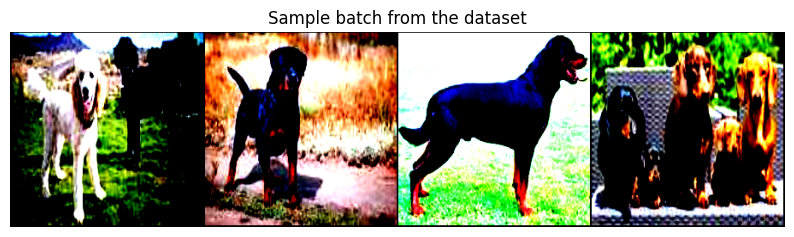

In [12]:
show_batch(data_module.train_dataloader())

## 3. LightningModule

Now, let's create our LightningModule for the transfer learning model:

In [13]:
class CatDogClassifier(L.LightningModule):
    def __init__(self, lr: float = 1e-3):
        super().__init__()
        self.lr = lr

        # Load pre-trained ResNet18 model
        self.model = timm.create_model('resnet18', pretrained=True, num_classes=2)

        # Multi-class accuracy with num_classes=2
        self.train_acc = Accuracy(task="multiclass", num_classes=2)
        self.val_acc = Accuracy(task="multiclass", num_classes=2)

        self.save_hyperparameters()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        preds = F.softmax(logits, dim=1)
        self.train_acc(preds, y)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_acc", self.train_acc, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        preds = F.softmax(logits, dim=1)
        self.val_acc(preds, y)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", self.val_acc, prog_bar=True)

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.lr)

# Visualization: Model Architecture
def visualize_model(model):
    from torchviz import make_dot
    x = torch.randn(1, 3, 224, 224)
    y = model(x)
    dot = make_dot(y, params=dict(model.named_parameters()))
    dot.render("model_architecture", format="png")
    display(Image("model_architecture.png"))

In [14]:
model = CatDogClassifier()

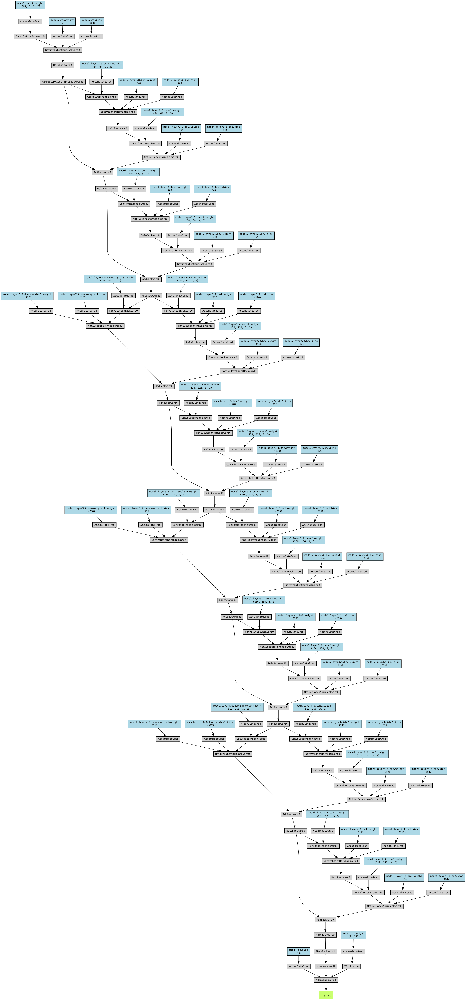

In [15]:
visualize_model(model)

## 4. Training

Finally, let's set up the training process:

In [16]:
checkpoint_callback = ModelCheckpoint(monitor="val_loss")

In [17]:
! pip install -U tensorboardX
#! pip install -U 'tensorboard'

In [18]:
# Initialize DataModule
data_module = CatDogImageDataModule(batch_size=32, num_workers=2)

# Initialize Model
model = CatDogClassifier(lr=1e-3)

In [19]:
# Initialize Trainer
trainer = L.Trainer(
    # fast_dev_run=True,
    # limit_train_batches=0.05,
    # limit_val_batches=0.05,
    max_epochs=5,
    callbacks=[
        checkpoint_callback,
    ],
    accelerator="auto",
    logger=TensorBoardLogger(save_dir="logs", name="ex-01")
    # deterministic=True
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [20]:
# Train the model
trainer.fit(model, data_module)

100%|██████████| 68606236/68606236 [00:09<00:00, 7191483.12it/s] 


Extracting ../data/extracted/dataset/cats_and_dogs_filtered.zip to ../data/extracted/dataset



  | Name      | Type               | Params | Mode 
---------------------------------------------------------
0 | model     | ResNet             | 11.2 M | train
1 | train_acc | MulticlassAccuracy | 0      | train
2 | val_acc   | MulticlassAccuracy | 0      | train
---------------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.710    Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/Users/vehere/anaconda3/envs/emlo4/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:419: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:01<00:01,  0.83it/s]

IndexError: Target 2 is out of bounds.

## 5. Logs

In [15]:
%load_ext tensorboard

In [16]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## 6. Inference

In [17]:
best_model_path = checkpoint_callback.best_model_path
model = CatDogClassifier.load_from_checkpoint(best_model_path)

In [18]:
best_model_path

'logs/ex-01/version_0/checkpoints/epoch=1-step=126.ckpt'

In [19]:
def inference(model, image_path):
    from PIL import Image as PILImage
    # Load and preprocess the image
    img = PILImage.open(image_path).convert('RGB')

    transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    # Apply the transform to the image
    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension

    # Move the input tensor to the same device as the model
    img_tensor = img_tensor.to(model.device)

    # Set the model to evaluation mode
    model.eval()

    # Perform inference
    with torch.no_grad():
        output = model(img_tensor)
        probabilities = F.softmax(output, dim=1)
        predicted_class = torch.argmax(probabilities, dim=1).item()

    # Map the predicted class to the label
    class_labels = ['cat', 'dog']  # Assuming 0 is cat and 1 is dog
    predicted_label = class_labels[predicted_class]
    confidence = probabilities[0][predicted_class].item()

    # Display the image and prediction
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {predicted_label.capitalize()} (Confidence: {confidence:.2f})')
    plt.show()

    return predicted_label, confidence

In [20]:
! wget -O dog.jpg https://www.akc.org/wp-content/uploads/2017/11/Shiba-Inu-standing-in-profile-outdoors.jpg

--2024-09-27 17:26:05--  https://www.akc.org/wp-content/uploads/2017/11/Shiba-Inu-standing-in-profile-outdoors.jpg
Resolving www.akc.org (www.akc.org)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to www.akc.org (www.akc.org)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48648 (48K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  47.51K  --.-KB/s    in 0.002s  

2024-09-27 17:26:05 (27.0 MB/s) - ‘dog.jpg’ saved [48648/48648]



In [21]:
! wget -O cat.jpg https://www.shutterstock.com/image-photo/cat-yellow-face-sitting-on-600nw-2470054451.jpg

--2024-09-27 17:26:05--  https://www.shutterstock.com/image-photo/cat-yellow-face-sitting-on-600nw-2470054451.jpg
Resolving www.shutterstock.com (www.shutterstock.com)... 13.35.238.67, 13.35.238.73, 13.35.238.84, ...
Connecting to www.shutterstock.com (www.shutterstock.com)|13.35.238.67|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40120 (39K) [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>]  39.18K  --.-KB/s    in 0.001s  

2024-09-27 17:26:05 (26.6 MB/s) - ‘cat.jpg’ saved [40120/40120]



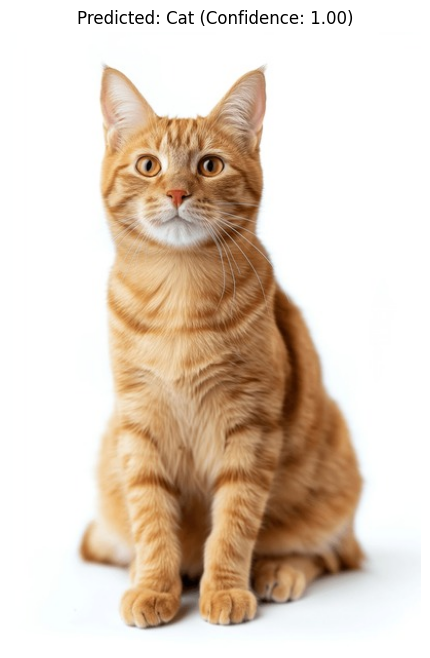

('cat', 0.9988948702812195)

In [22]:
inference(model, "cat.jpg")

In [23]:
! wget -O cat1.jpg https://static01.nyt.com/images/2021/09/14/science/07CAT-STRIPES/07CAT-STRIPES-mediumSquareAt3X-v2.jpg

--2024-09-27 17:32:23--  https://static01.nyt.com/images/2021/09/14/science/07CAT-STRIPES/07CAT-STRIPES-mediumSquareAt3X-v2.jpg
Resolving static01.nyt.com (static01.nyt.com)... 151.101.1.164, 151.101.65.164, 151.101.129.164, ...
Connecting to static01.nyt.com (static01.nyt.com)|151.101.1.164|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 634575 (620K) [image/jpeg]
Saving to: ‘cat1.jpg’

cat1.jpg            100%[===================>] 619.70K  --.-KB/s    in 0.004s  

2024-09-27 17:32:23 (136 MB/s) - ‘cat1.jpg’ saved [634575/634575]



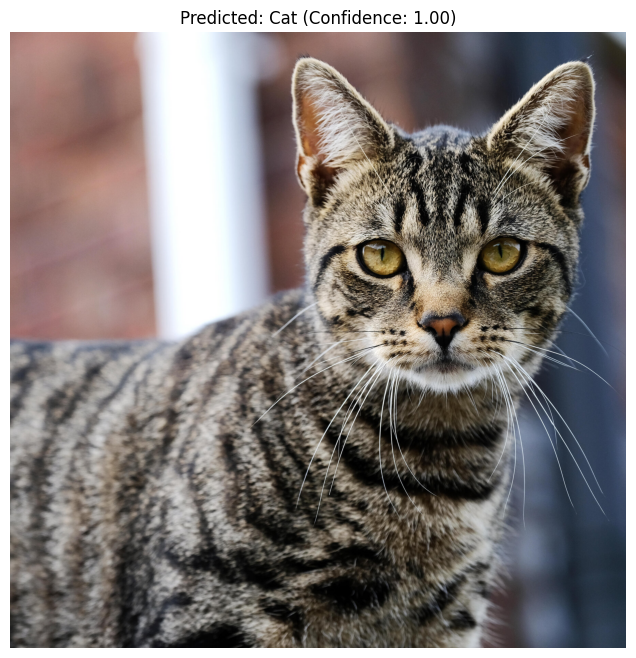

('cat', 0.9998911619186401)

In [24]:
inference(model, "cat1.jpg")